# Income of a Person Prediction using ANN
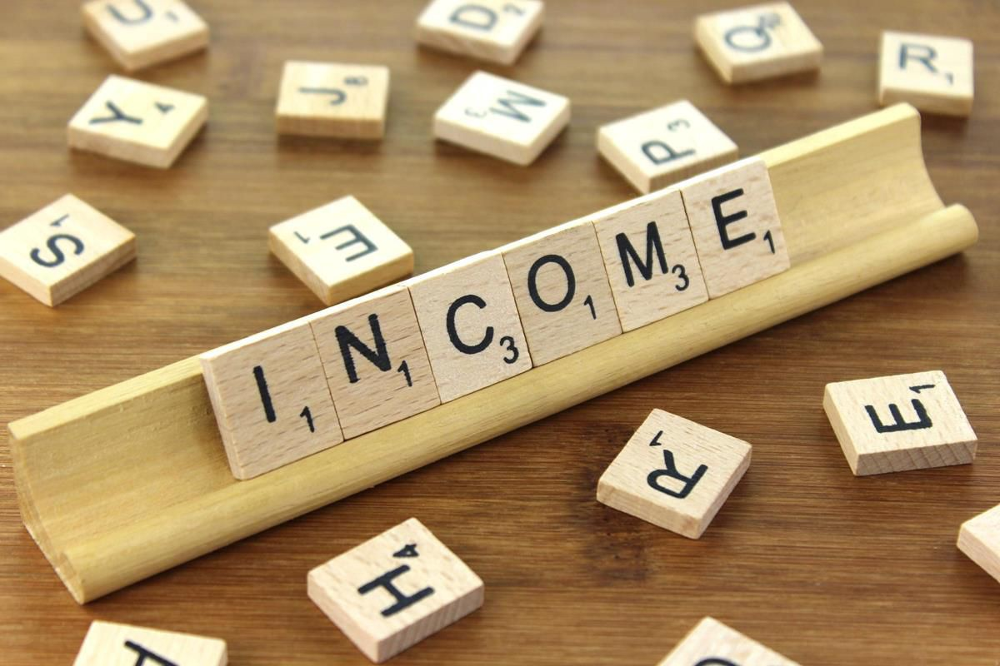

In [1]:
import numpy as np
import pandas as pd
import missingno as m
import tensorflow as tf
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

# Dataset reading

In [2]:
df = pd.read_csv('income_evaluation.csv')
df.head()

,age,workclass,fnlwgt,education,education-num,marital-status,occupation,relationship,race,sex,capital-gain,capital-loss,hours-per-week,native-country,income
0,39,State-gov,77516,Bachelors,13,Never-married,Adm-clerical,Not-in-family,White,Male,2174,0,40,United-States,<=50K
1,50,Self-emp-not-inc,83311,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,13,United-States,<=50K
2,38,Private,215646,HS-grad,9,Divorced,Handlers-cleaners,Not-in-family,White,Male,0,0,40,United-States,<=50K
3,53,Private,234721,11th,7,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,0,0,40,United-States,<=50K
4,28,Private,338409,Bachelors,13,Married-civ-spouse,Prof-specialty,Wife,Black,Female,0,0,40,Cuba,<=50K


In [3]:
df.shape

(32561, 15)

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32561 entries, 0 to 32560
Data columns (total 15 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   age             32561 non-null  int64 
 1   workclass       32561 non-null  object
 2   fnlwgt          32561 non-null  int64 
 3   education       32561 non-null  object
 4   education-num   32561 non-null  int64 
 5   marital-status  32561 non-null  object
 6   occupation      32561 non-null  object
 7   relationship    32561 non-null  object
 8   race            32561 non-null  object
 9   sex             32561 non-null  object
 10  capital-gain    32561 non-null  int64 
 11  capital-loss    32561 non-null  int64 
 12  hours-per-week  32561 non-null  int64 
 13  native-country  32561 non-null  object
 14  income          32561 non-null  object
dtypes: int64(6), object(9)
memory usage: 3.7+ MB


In [5]:
df.describe()

,age,fnlwgt,education-num,capital-gain,capital-loss,hours-per-week
count,32561.000000,3.256100e+04,32561.000000,32561.000000,32561.000000,32561.000000
mean,38.581647,1.897784e+05,10.080679,1077.648844,87.303830,40.437456
std,13.640433,1.055500e+05,2.572720,7385.292085,402.960219,12.347429
min,17.000000,1.228500e+04,1.000000,0.000000,0.000000,1.000000
25%,28.000000,1.178270e+05,9.000000,0.000000,0.000000,40.000000
50%,37.000000,1.783560e+05,10.000000,0.000000,0.000000,40.000000
75%,48.000000,2.370510e+05,12.000000,0.000000,0.000000,45.000000
max,90.000000,1.484705e+06,16.000000,99999.000000,4356.000000,99.000000


# Data Cleaning

<AxesSubplot:>

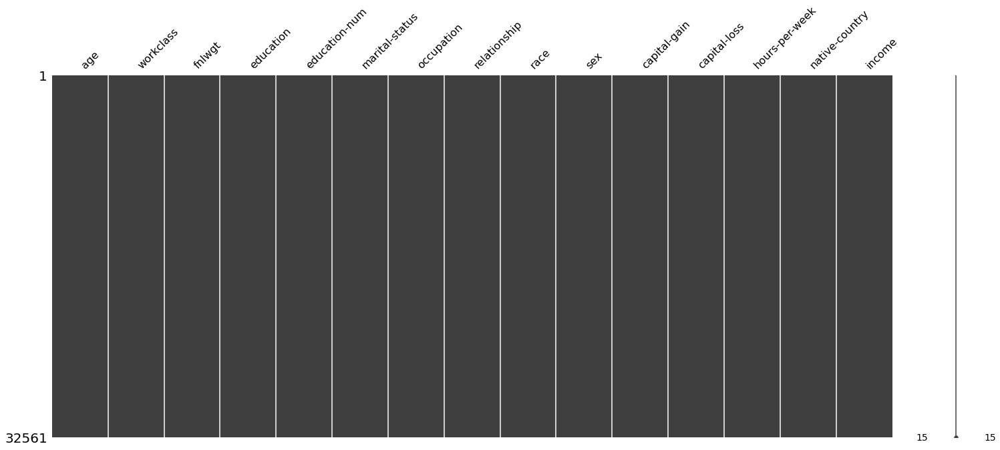

In [6]:
m.matrix(df)

In [7]:
df.isnull().sum()

age               0
workclass         0
fnlwgt            0
education         0
education-num     0
marital-status    0
occupation        0
relationship      0
race              0
sex               0
capital-gain      0
capital-loss      0
hours-per-week    0
native-country    0
income            0
dtype: int64

### Data is Already Cleaned

In [8]:
df.head()

,age,workclass,fnlwgt,education,education-num,marital-status,occupation,relationship,race,sex,capital-gain,capital-loss,hours-per-week,native-country,income
0,39,State-gov,77516,Bachelors,13,Never-married,Adm-clerical,Not-in-family,White,Male,2174,0,40,United-States,<=50K
1,50,Self-emp-not-inc,83311,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,13,United-States,<=50K
2,38,Private,215646,HS-grad,9,Divorced,Handlers-cleaners,Not-in-family,White,Male,0,0,40,United-States,<=50K
3,53,Private,234721,11th,7,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,0,0,40,United-States,<=50K
4,28,Private,338409,Bachelors,13,Married-civ-spouse,Prof-specialty,Wife,Black,Female,0,0,40,Cuba,<=50K


# Expalanatory Data Analysis (EDA)

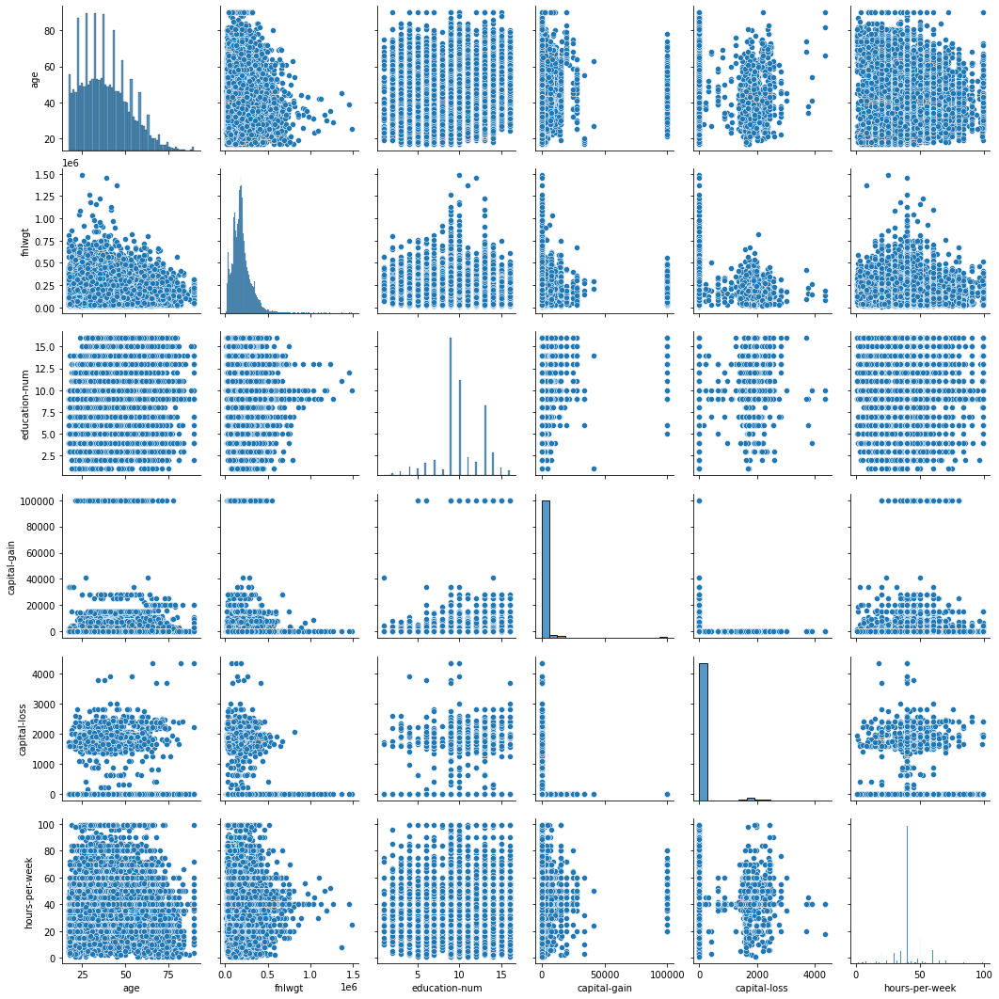

In [9]:
sns.pairplot(df)

<AxesSubplot:xlabel='sex', ylabel='count'>

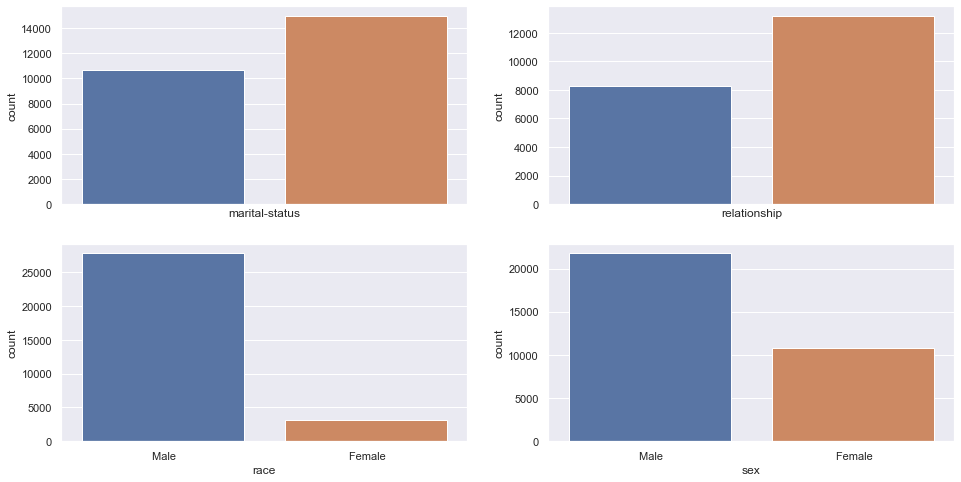

In [10]:
sns.set_theme(style="darkgrid")
fig, axes = plt.subplots(2, 2, sharex=True, figsize=(16,8))
sns.countplot(ax=axes[0,0],x='marital-status',data = df)
sns.countplot(ax=axes[0,1],x='relationship',data = df)
sns.countplot(ax=axes[1,0],x='race',data = df)
sns.countplot(ax=axes[1,1],x='sex',data = df)


In [11]:
fig = px.box(df, y="fnlwgt",color='marital-status')
fig.show()

### Workclass vs Income Plot

In [12]:
fig = px.histogram(df, x="workclass",color='income')
fig.show()

### Education vs Income Plot

In [13]:
fig = px.histogram(df, x="education",color='income')
fig.show()

### Marital Status vs Income Plot

In [14]:
fig = px.histogram(df, x="marital-status",color='income')
fig.show()

### Occupation vs Income plot

In [15]:
fig = px.histogram(df, x="occupation",color='income')
fig.show()

In [16]:
fig = px.scatter_3d(df, y="hours-per-week", x="age",z='fnlwgt',color='relationship')
fig.show()

In [17]:
fig = px.scatter_3d(df, x='age', y='education-num', z='hours-per-week',
              color='race', size='capital-loss', size_max=18,
              symbol='occupation', opacity=0.7)
fig.show()

In [18]:
df.head()

,age,workclass,fnlwgt,education,education-num,marital-status,occupation,relationship,race,sex,capital-gain,capital-loss,hours-per-week,native-country,income
0,39,State-gov,77516,Bachelors,13,Never-married,Adm-clerical,Not-in-family,White,Male,2174,0,40,United-States,<=50K
1,50,Self-emp-not-inc,83311,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,13,United-States,<=50K
2,38,Private,215646,HS-grad,9,Divorced,Handlers-cleaners,Not-in-family,White,Male,0,0,40,United-States,<=50K
3,53,Private,234721,11th,7,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,0,0,40,United-States,<=50K
4,28,Private,338409,Bachelors,13,Married-civ-spouse,Prof-specialty,Wife,Black,Female,0,0,40,Cuba,<=50K


# Label Encoder for Categorical Variables

In [19]:
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
df['workclass'] = le.fit_transform(df['workclass'])
df['education'] = le.fit_transform(df['education'])
df['marital-status'] = le.fit_transform(df['marital-status'])
df['occupation'] = le.fit_transform(df['occupation'])
df['relationship'] = le.fit_transform(df['relationship'])
df['race'] = le.fit_transform(df['race'])
df['sex'] = le.fit_transform(df['sex'])
df['native-country'] = le.fit_transform(df['native-country'])
df['income'] = le.fit_transform(df['income'])



In [20]:
df.head()

,age,workclass,fnlwgt,education,education-num,marital-status,occupation,relationship,race,sex,capital-gain,capital-loss,hours-per-week,native-country,income
0,39,7,77516,9,13,4,1,1,4,1,2174,0,40,39,0
1,50,6,83311,9,13,2,4,0,4,1,0,0,13,39,0
2,38,4,215646,11,9,0,6,1,4,1,0,0,40,39,0
3,53,4,234721,1,7,2,6,0,2,1,0,0,40,39,0
4,28,4,338409,9,13,2,10,5,2,0,0,0,40,5,0


# Heatmap

<AxesSubplot:>

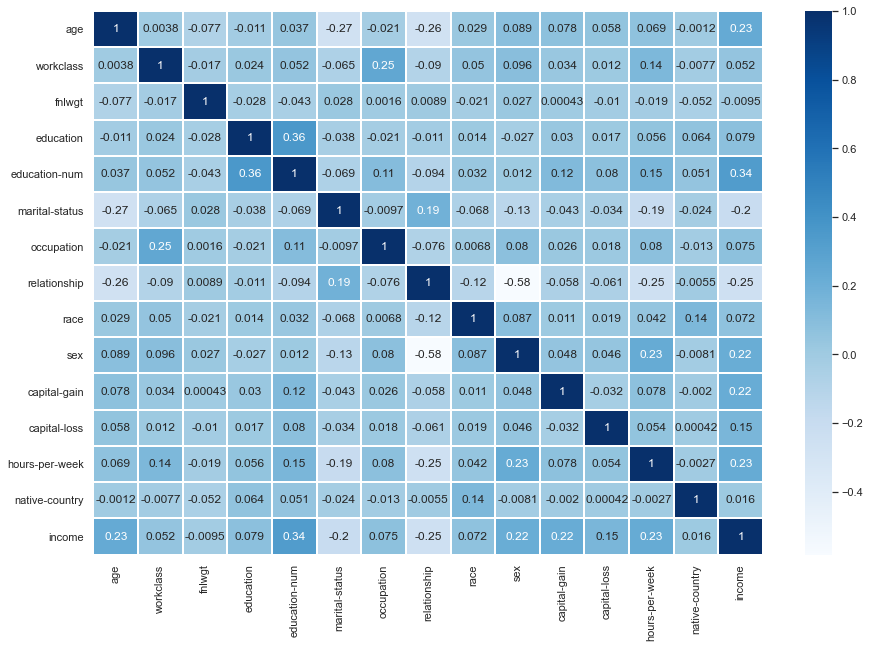

In [21]:
plt.subplots(figsize=(15,10))
sns.heatmap(df.corr(),annot =True, linewidth=1,cmap='Blues')

# X and y Split

In [22]:
X = df.iloc[:, 3:-1].values
y = df.iloc[:, -1].values

# Train Test Split

In [23]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 0)

# Feature Scaling

In [24]:
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
X_train = sc.fit_transform(X_train)
X_test = sc.transform(X_test)

# Building ANN Architecture 
### 1 Input Layer
### 3 Hidden Layers 
### 1 Output Layer

In [25]:
ann = tf.keras.models.Sequential()
ann.add(tf.keras.layers.Dense(units=20, activation='relu'))
ann.add(tf.keras.layers.Dense(units=35, activation='relu'))
ann.add(tf.keras.layers.Dense(units=10, activation='relu'))
ann.add(tf.keras.layers.Dense(units=1, activation='sigmoid'))

# AdaDelta Optimizer is used 

In [26]:
ann.compile(optimizer = 'Adadelta', loss = 'binary_crossentropy', metrics = ['accuracy'])

In [27]:
history = ann.fit(X_train, y_train, batch_size = 32, epochs = 600)

Epoch 1/600
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
814/814 [==============================] - 1s 1ms/step - loss: 0.6349 - accuracy: 0.7591
Epoch 2/600
814/814 [==============================] - 1s 919us/step - loss: 0.6313 - accuracy: 0.7596
Epoch 3/600
814/814 [==============================] - 1s 892us/step - loss: 0.6277 - accuracy: 0.7598
Epoch 4/600
814/814 [==============================] - 1s 859us/step - 

814/814 [==============================] - 1s 984us/step - loss: 0.4843 - accuracy: 0.7619
Epoch 72/600
814/814 [==============================] - 1s 1ms/step - loss: 0.4834 - accuracy: 0.7625
Epoch 73/600
814/814 [==============================] - 1s 1ms/step - loss: 0.4824 - accuracy: 0.7637
Epoch 74/600
814/814 [==============================] - 1s 881us/step - loss: 0.4814 - accuracy: 0.7642
Epoch 75/600
814/814 [==============================] - 1s 862us/step - loss: 0.4805 - accuracy: 0.7647
Epoch 76/600
814/814 [==============================] - 1s 882us/step - loss: 0.4796 - accuracy: 0.7658
Epoch 77/600
814/814 [==============================] - 1s 856us/step - loss: 0.4786 - accuracy: 0.7668
Epoch 78/600
814/814 [==============================] - 1s 892us/step - loss: 0.4777 - accuracy: 0.7672
Epoch 79/600
814/814 [==============================] - 1s 887us/step - loss: 0.4768 - accuracy: 0.7674
Epoch 80/600
814/814 [==============================] - 1s 896us/step - loss: 0.4

814/814 [==============================] - 1s 926us/step - loss: 0.4339 - accuracy: 0.8105
Epoch 150/600
814/814 [==============================] - 1s 1ms/step - loss: 0.4335 - accuracy: 0.8104
Epoch 151/600
814/814 [==============================] - 1s 972us/step - loss: 0.4331 - accuracy: 0.8104
Epoch 152/600
814/814 [==============================] - 1s 1ms/step - loss: 0.4328 - accuracy: 0.8107
Epoch 153/600
814/814 [==============================] - 1s 1ms/step - loss: 0.4324 - accuracy: 0.8105
Epoch 154/600
814/814 [==============================] - 1s 974us/step - loss: 0.4320 - accuracy: 0.8107
Epoch 155/600
814/814 [==============================] - 1s 1ms/step - loss: 0.4316 - accuracy: 0.8107: 0s - loss: 0.4
Epoch 156/600
814/814 [==============================] - 1s 909us/step - loss: 0.4313 - accuracy: 0.8105
Epoch 157/600
814/814 [==============================] - 1s 909us/step - loss: 0.4309 - accuracy: 0.8106
Epoch 158/600
814/814 [==============================] - 1s 9

814/814 [==============================] - 1s 1ms/step - loss: 0.4122 - accuracy: 0.8192: 0s - loss: 0.4115 - accura
Epoch 226/600
814/814 [==============================] - 1s 971us/step - loss: 0.4120 - accuracy: 0.8193
Epoch 227/600
814/814 [==============================] - 1s 924us/step - loss: 0.4118 - accuracy: 0.8193
Epoch 228/600
814/814 [==============================] - 1s 974us/step - loss: 0.4116 - accuracy: 0.8193
Epoch 229/600
814/814 [==============================] - 1s 998us/step - loss: 0.4114 - accuracy: 0.81940s - los
Epoch 230/600
814/814 [==============================] - 1s 954us/step - loss: 0.4112 - accuracy: 0.8193
Epoch 231/600
814/814 [==============================] - 1s 918us/step - loss: 0.4109 - accuracy: 0.81970s - loss: 0.4106 - accuracy
Epoch 232/600
814/814 [==============================] - 1s 983us/step - loss: 0.4107 - accuracy: 0.8200
Epoch 233/600
814/814 [==============================] - 1s 941us/step - loss: 0.4105 - accuracy: 0.8200
Epoch 2

814/814 [==============================] - 1s 980us/step - loss: 0.3979 - accuracy: 0.8242
Epoch 303/600
814/814 [==============================] - 1s 1ms/step - loss: 0.3977 - accuracy: 0.8242
Epoch 304/600
814/814 [==============================] - 1s 1ms/step - loss: 0.3976 - accuracy: 0.8243
Epoch 305/600
814/814 [==============================] - 1s 1ms/step - loss: 0.3974 - accuracy: 0.8243
Epoch 306/600
814/814 [==============================] - 1s 914us/step - loss: 0.3972 - accuracy: 0.8243
Epoch 307/600
814/814 [==============================] - 1s 919us/step - loss: 0.3970 - accuracy: 0.8243
Epoch 308/600
814/814 [==============================] - 1s 920us/step - loss: 0.3969 - accuracy: 0.8245
Epoch 309/600
814/814 [==============================] - 1s 899us/step - loss: 0.3967 - accuracy: 0.8245
Epoch 310/600
814/814 [==============================] - 1s 916us/step - loss: 0.3965 - accuracy: 0.8245
Epoch 311/600
814/814 [==============================] - 1s 910us/step - lo

814/814 [==============================] - 1s 946us/step - loss: 0.3846 - accuracy: 0.8264
Epoch 381/600
814/814 [==============================] - 1s 1ms/step - loss: 0.3845 - accuracy: 0.8264
Epoch 382/600
814/814 [==============================] - 1s 993us/step - loss: 0.3843 - accuracy: 0.8264
Epoch 383/600
814/814 [==============================] - 1s 880us/step - loss: 0.3842 - accuracy: 0.8265
Epoch 384/600
814/814 [==============================] - 1s 869us/step - loss: 0.3840 - accuracy: 0.8266
Epoch 385/600
814/814 [==============================] - 1s 923us/step - loss: 0.3839 - accuracy: 0.8266
Epoch 386/600
814/814 [==============================] - 1s 879us/step - loss: 0.3837 - accuracy: 0.8266
Epoch 387/600
814/814 [==============================] - 1s 902us/step - loss: 0.3836 - accuracy: 0.8267
Epoch 388/600
814/814 [==============================] - 1s 903us/step - loss: 0.3834 - accuracy: 0.8269
Epoch 389/600
814/814 [==============================] - 1s 919us/step 

814/814 [==============================] - 1s 895us/step - loss: 0.3749 - accuracy: 0.8292
Epoch 458/600
814/814 [==============================] - 1s 900us/step - loss: 0.3748 - accuracy: 0.8292
Epoch 459/600
814/814 [==============================] - 1s 898us/step - loss: 0.3747 - accuracy: 0.8292
Epoch 460/600
814/814 [==============================] - 1s 899us/step - loss: 0.3746 - accuracy: 0.8292
Epoch 461/600
814/814 [==============================] - 1s 935us/step - loss: 0.3745 - accuracy: 0.8292
Epoch 462/600
814/814 [==============================] - 1s 1ms/step - loss: 0.3744 - accuracy: 0.8292
Epoch 463/600
814/814 [==============================] - 1s 1ms/step - loss: 0.3743 - accuracy: 0.8292
Epoch 464/600
814/814 [==============================] - 1s 976us/step - loss: 0.3742 - accuracy: 0.82920s - loss: 0.3773 - ac
Epoch 465/600
814/814 [==============================] - 1s 933us/step - loss: 0.3741 - accuracy: 0.8292
Epoch 466/600
814/814 [============================

814/814 [==============================] - 1s 1ms/step - loss: 0.3679 - accuracy: 0.8316
Epoch 535/600
814/814 [==============================] - 1s 1ms/step - loss: 0.3678 - accuracy: 0.8317
Epoch 536/600
814/814 [==============================] - 1s 1ms/step - loss: 0.3677 - accuracy: 0.8318
Epoch 537/600
814/814 [==============================] - 1s 1ms/step - loss: 0.3677 - accuracy: 0.8318
Epoch 538/600
814/814 [==============================] - 1s 1ms/step - loss: 0.3676 - accuracy: 0.8319
Epoch 539/600
814/814 [==============================] - 1s 2ms/step - loss: 0.3675 - accuracy: 0.8318
Epoch 540/600
814/814 [==============================] - 1s 2ms/step - loss: 0.3674 - accuracy: 0.8319
Epoch 541/600
814/814 [==============================] - 1s 1ms/step - loss: 0.3673 - accuracy: 0.8319
Epoch 542/600
814/814 [==============================] - 1s 1ms/step - loss: 0.3673 - accuracy: 0.8322
Epoch 543/600
814/814 [==============================] - 1s 1ms/step - loss: 0.3672 - a

In [28]:
print(history.history.keys())

dict_keys(['loss', 'accuracy'])


# Accuracy and Loss of Epochs Plot

In [36]:
fig = px.line(y=history.history['accuracy'])
fig.show()
fig = px.line(y=history.history['loss'])
fig.show()


# Prediction

In [30]:
y_pred = ann.predict(X_test)

y_pred = (y_pred > 0.5)



Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert


In [31]:
data = np.concatenate((y_pred.reshape(len(y_pred),1), y_test.reshape(len(y_test),1)),1)
data

array([[0, 0],
       [0, 0],
       [1, 0],
       ...,
       [1, 1],
       [0, 0],
       [0, 1]])

# Confusion Matrix

In [32]:
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report
cm = confusion_matrix(y_test, y_pred)
print(cm)

[[4614  304]
 [ 781  814]]


<AxesSubplot:>

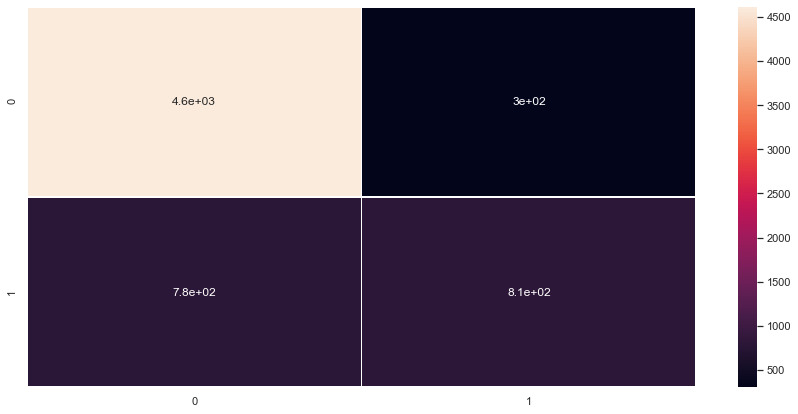

In [33]:
plt.subplots(figsize=(15,7))
sns.heatmap(cm,annot=True,linewidth=1)

# Accuracy

In [37]:
print('Accuracy : ',accuracy_score(y_test, y_pred))

Accuracy :  0.8334101028711807


In [35]:
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       0.86      0.94      0.89      4918
           1       0.73      0.51      0.60      1595

    accuracy                           0.83      6513
   macro avg       0.79      0.72      0.75      6513
weighted avg       0.82      0.83      0.82      6513



# This Model can predict Income of a Person with an Accuracy of 83%.